# Extract Datasets

This script extracts a dataset from its source and seperates the samples for each label and writes them as byte files.

In [7]:
from matplotlib import pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import pickle
import os

from PIL import Image
import io

In [8]:
LOCATION = "tiny-imagenet/"

In [9]:
def bytes_to_array(byte_data):

    image = Image.open(io.BytesIO(byte_data))
    if image.mode != "RGB":
        image = image.convert("RGB")
        
    image_array = np.array(image).astype(np.float32)/255.0

    return image_array

train_df = pd.read_parquet(LOCATION + 'train.parquet')
x_train = np.array([
    x for x in train_df["image.bytes"].apply(bytes_to_array) # type: ignore
])
y_train = train_df["label"].values
del train_df

test_df = pd.read_parquet(LOCATION + 'test.parquet')
x_test = np.array([
    x for x in test_df["image.bytes"].apply(bytes_to_array) # type: ignore
])
y_test = test_df["label"].values
del test_df

x_train.shape, y_train.shape, x_test.shape, y_test.shape

((100000, 64, 64, 3), (100000,), (10000, 64, 64, 3), (10000,))

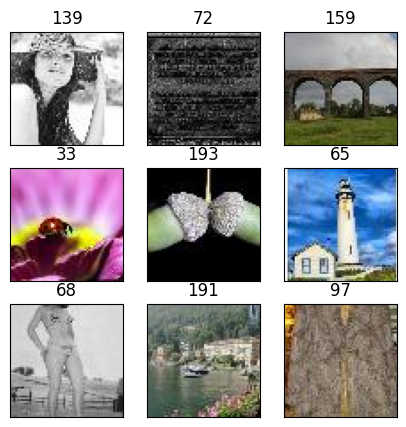

In [10]:
plt.figure(figsize=(5, 5))

for i in range(9):

    plt.subplot(3, 3, i+1)

    j = np.random.randint(0, x_test.shape[0]) # type: ignore

    plt.title(y_test[j])
    plt.imshow(x_test[j])
    plt.xticks([])
    plt.yticks([])
    
plt.show()

In [11]:
labels = np.unique(y_test)

for label in labels:

    indices = y_train == label

    with open(LOCATION + "train/label_%d.b"%label, "wb") as file:

        pickle.dump(
            (y_train[indices], x_train[indices]), 
            file
        )

del x_train, y_train

for label in labels:

    indices = y_test == label

    with open(LOCATION + "test/label_%d.b"%label, "wb") as file:
        
        pickle.dump(
            (y_test[indices], x_test[indices]), 
            file
        )

del x_test, y_test

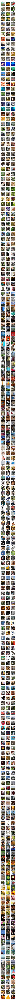

In [12]:
i, m, n = 1, 3, len(labels)

plt.figure(figsize=(m, n))

for label in labels:

    with open(LOCATION + "train/label_%d.b"%label, "rb") as file:

        _, images = pickle.load(file)

        for image in images[:m]:

            plt.subplot(n, m, i)
            plt.title(label)
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])

            i += 1

plt.show()

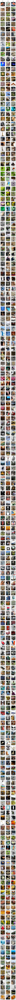

In [13]:
i, m, n = 1, 3, len(labels)

plt.figure(figsize=(m, n))

for label in labels:

    with open(LOCATION + "test/label_%d.b"%label, "rb") as file:

        _, images = pickle.load(file)

        for image in images[:m]:

            plt.subplot(n, m, i)
            plt.title(label)
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])

            i += 1

plt.show()